# XGBOOST로 전력소비량 예측

- xgb8의 feature_importance 확인 결과 building에 포함된 변수들 중요도 싹 다 0
- 따라서 building을 아예 버리고 일단 값 확인 -> xgb8이랑 결과 아예 똑같음 -> building은 버리는 것이 맞다..
- 추가로 체감온도 변수 추가해서 성능 확인 -> 체감온도만 추가했을때는 아예 학습을 못함;;
- 다중공선성 때문일수도 있으니 windspeed(풍속) 제거 후 다시 확인 -> 5.99 나옴
- 이번엔 기온도 제거해보기 -> 5.99 나옴

## Load Library

In [269]:
# Import Module
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import datetime
from tqdm import tqdm
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split
import seaborn as sns
import xgboost
from sklearn.svm import SVR
from sklearn.cluster import KMeans
from sklearn.model_selection import KFold
from tslearn.clustering import TimeSeriesKMeans, silhouette_score
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.utils.plotting import plot_series
from xgboost import XGBRegressor

import warnings
warnings.filterwarnings('ignore')

In [270]:
# Fixed random seed
def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)

seed_everything(42)

## Load Data

In [271]:
# Load Data
train = pd.read_csv('../data/train.csv')
test = pd.read_csv('../data/test.csv')
building = pd.read_csv('../data/building_info.csv')
sample_submission = pd.read_csv('../data/sample_submission.csv')

In [272]:
# train
display(train.head())
train.info()
train.shape

,num_date_time,건물번호,일시,기온(C),강수량(mm),풍속(m/s),습도(%),일조(hr),일사(MJ/m2),전력소비량(kWh)
0,1_20220601 00,1,20220601 00,18.6,NaN,0.9,42.0,NaN,NaN,1085.28
1,1_20220601 01,1,20220601 01,18.0,NaN,1.1,45.0,NaN,NaN,1047.36
2,1_20220601 02,1,20220601 02,17.7,NaN,1.5,45.0,NaN,NaN,974.88
3,1_20220601 03,1,20220601 03,16.7,NaN,1.4,48.0,NaN,NaN,953.76
4,1_20220601 04,1,20220601 04,18.4,NaN,2.8,43.0,NaN,NaN,986.40


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 204000 entries, 0 to 203999
Data columns (total 10 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   num_date_time  204000 non-null  object 
 1   건물번호           204000 non-null  int64  
 2   일시             204000 non-null  object 
 3   기온(C)          204000 non-null  float64
 4   강수량(mm)        43931 non-null   float64
 5   풍속(m/s)        203981 non-null  float64
 6   습도(%)          203991 non-null  float64
 7   일조(hr)         128818 non-null  float64
 8   일사(MJ/m2)      116087 non-null  float64
 9   전력소비량(kWh)     204000 non-null  float64
dtypes: float64(7), int64(1), object(2)
memory usage: 15.6+ MB


(204000, 10)

In [273]:
# test
display(test.head())
test.info()
test.shape

,num_date_time,건물번호,일시,기온(C),강수량(mm),풍속(m/s),습도(%)
0,1_20220825 00,1,20220825 00,23.5,0.0,2.2,72
1,1_20220825 01,1,20220825 01,23.0,0.0,0.9,72
2,1_20220825 02,1,20220825 02,22.7,0.0,1.5,75
3,1_20220825 03,1,20220825 03,22.1,0.0,1.3,78
4,1_20220825 04,1,20220825 04,21.8,0.0,1.0,77


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16800 entries, 0 to 16799
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   num_date_time  16800 non-null  object 
 1   건물번호           16800 non-null  int64  
 2   일시             16800 non-null  object 
 3   기온(C)          16800 non-null  float64
 4   강수량(mm)        16800 non-null  float64
 5   풍속(m/s)        16800 non-null  float64
 6   습도(%)          16800 non-null  int64  
dtypes: float64(3), int64(2), object(2)
memory usage: 918.9+ KB


(16800, 7)

In [274]:
# # building
# display(building.head())
# building.info()
# building.shape

In [275]:
# # 건물유형 값 영어로 변경
# translation_dict = {
#     '건물기타': 'Other Buildings',
#     '공공': 'Public',
#     '대학교': 'University',
#     '데이터센터': 'Data Center',
#     '백화점및아울렛': 'Department Store and Outlet',
#     '병원': 'Hospital',
#     '상용': 'Commercial',
#     '아파트': 'Apartment',
#     '연구소': 'Research Institute',
#     '지식산업센터': 'Knowledge Industry Center',
#     '할인마트': 'Discount Mart',
#     '호텔및리조트': 'Hotel and Resort'
# }

# building['건물유형'] = building['건물유형'].replace(translation_dict)

In [276]:
# Merge data
# 건물번호를 기준으로 train, test data와 building data merge
train_df = train.copy()
test_df = test.copy()

# train_df = pd.merge(train_df, building, on='건물번호')
# test_df = pd.merge(test_df, building, on='건물번호')

In [277]:
# Drop the unnecessary columns for analysis
train_df.drop(columns=['num_date_time', '일조(hr)', '일사(MJ/m2)'], inplace=True)
test_df.drop(columns=['num_date_time'], inplace=True)

In [278]:
# Rename columns
train_df.columns = ['building_num', 'date', 'temperature', 'precipitation', 'windspeed', 'humidity', 'power_consumption']
test_df.columns = ['building_num', 'date', 'temperature', 'precipitation', 'windspeed', 'humidity']

In [279]:
train_df

,building_num,date,temperature,precipitation,windspeed,humidity,power_consumption
0,1,20220601 00,18.6,NaN,0.9,42.0,1085.28
1,1,20220601 01,18.0,NaN,1.1,45.0,1047.36
2,1,20220601 02,17.7,NaN,1.5,45.0,974.88
3,1,20220601 03,16.7,NaN,1.4,48.0,953.76
4,1,20220601 04,18.4,NaN,2.8,43.0,986.40
...,...,...,...,...,...,...,...
203995,100,20220824 19,23.1,NaN,0.9,86.0,881.04
203996,100,20220824 20,22.4,NaN,1.3,86.0,798.96
203997,100,20220824 21,21.3,NaN,1.0,92.0,825.12
203998,100,20220824 22,21.0,NaN,0.3,94.0,640.08


## Data Preprocessing

In [280]:
# Process the missing values of precipitation
train_df['precipitation'].fillna(0, inplace=True) # 강수량은 0으로 채움

In [281]:
# Process the missing values of wind speed and humidity
def fill_missing_with_avg(df, columns):
    for i in range(len(df)):
        if pd.isna(df.loc[i, columns]):
            
            prev_value_sum = df.loc[i-4:i-1, columns].sum()
            next_value_sum = df.loc[i+1:i+4, columns].sum()
            avg_value = (prev_value_sum + next_value_sum) / 8

            df.loc[i, columns] = avg_value

fill_missing_with_avg(train_df, 'windspeed')
fill_missing_with_avg(train_df, 'humidity')

In [282]:
# Convert the type of date from object to datetime
train_df['date'] = pd.to_datetime(train_df['date'], format='%Y%m%d %H')

In [283]:
# Decomposition of time elements
train_df['month'] = train_df.date.dt.month
train_df['day'] = train_df.date.dt.day
train_df['weekday'] = train_df.date.dt.weekday
train_df['hour'] = train_df.date.dt.hour
train_df['date'] = train_df.date.dt.date

In [284]:
# Add time periodic columns
day_periodic = (train_df['day'] - 1) / 30 # 1부터 시작하므로 1을 빼줌
weekday_periodic = train_df['weekday'] / 6
hour_periodic = train_df['hour'] / 23

def sin_transform(values):
    return np.sin(2 * np.pi * values)
def cos_transform(values):
    return np.cos(2 * np.pi * values)

train_df['sin_weekday'] = sin_transform(weekday_periodic)
train_df['cos_weekday'] = cos_transform(weekday_periodic)
train_df['sin_hour'] = sin_transform(hour_periodic)
train_df['cos_hour'] = cos_transform(hour_periodic)

In [285]:
month_dummy = pd.get_dummies(train_df['month']).rename(columns={6:'month_6', 7:'month_7', 8:'month_8'})
train_df = pd.concat([train_df, month_dummy[['month_6', 'month_7']]], axis=1)

In [286]:
# Add holiday column
# holiday = 1, workday = 0
train_df['holiday'] = train_df.apply(lambda x : 0 if x['day']<5 else 1, axis = 1)
train_df.loc[(train_df.date == datetime.date(2022, 6, 6))&(train_df.date == datetime.date(2022, 8, 15)), 'holiday'] = 1

In [287]:
# Add DI column (DI : Discomfort Index (불쾌지수))
train_df['DI'] = 9/5*train_df['temperature'] - 0.55*(1 - train_df['humidity']/100) * (9/5*train_df['humidity'] - 26) + 32

In [288]:
# Add CDH column (CDH : Cooling Degree-Day)
# CDD(냉방도일) -> CDH(냉방도시)로 데이터에 맞게 변형한 개념
# 냉방도일 : 어느 지방의 더운 정도를 나타내는 지표로 사용 (sum(해당 일의 기온 - 기준온도))
# 냉방도일이 크면 연료의 소비량이 많아짐
# 실내온도가 같아도 외부 기온은 지역별로 다름 -> 지역마다 값이 다르게 나타남 -> 이 데이터에서는 건물별로 다르다고 얘기할 수 있음
# 냉방도시 : sum(해당 시간의 기온 - 기준온도)
def CDH(df, num_building):
    df_ = df.copy()
    cdhs = np.array([])
    for num in range(1, num_building+1, 1):
        cdh = []
        cdh_df = df_[df_['building_num'] == num_building]
        cdh_temp = cdh_df['temperature'].values # Series로도 돌릴 수 있지만 array로 돌리는게 속도가 훨씬 빠름
        for i in range(len(cdh_temp)):
            if i < 11:
                cdh.append(np.sum(cdh_temp[:(i+1)] - 26))
            else:
                cdh.append(np.sum(cdh_temp[(i-11):(i+1)] - 26))
        
        cdhs = np.concatenate([cdhs, cdh])
    
    return cdhs

train_df['CDH'] = CDH(train_df, 100)

In [289]:
# 건물별, 요일별, 시간별 발전량 평균 넣어주기
power_mean = pd.pivot_table(train_df, values = 'power_consumption', index = ['building_num', 'hour', 'weekday'], aggfunc = np.mean).reset_index()
tqdm.pandas()
train_df['day_hour_mean'] = train_df.progress_apply(lambda x : power_mean.loc[(power_mean.building_num == x['building_num']) & (power_mean.hour == x['hour']) & (power_mean.weekday == x['weekday']), 'power_consumption'].values[0], axis = 1)

  0%|          | 0/204000 [00:00<?, ?it/s]

100%|██████████| 204000/204000 [01:38<00:00, 2062.14it/s]


In [290]:
# 건물별, 요일별, 시간별 발전량 표준편차 넣어주기
power_std = pd.pivot_table(train_df, values = 'power_consumption', index = ['building_num', 'hour', 'weekday'], aggfunc = np.std).reset_index()
tqdm.pandas()
train_df['day_hour_std'] = train_df.progress_apply(lambda x : power_std.loc[(power_std.building_num == x['building_num']) & (power_std.hour == x['hour']) & (power_std.weekday == x['weekday']), 'power_consumption'].values[0], axis = 1)

100%|██████████| 204000/204000 [01:40<00:00, 2033.10it/s]


In [291]:
# 건물별 시간별 발전량 평균 넣어주기
power_hour_mean = pd.pivot_table(train_df, values = 'power_consumption', index = ['building_num', 'hour'], aggfunc = np.mean).reset_index()
tqdm.pandas()
train_df['hour_mean'] = train_df.progress_apply(lambda x : power_hour_mean.loc[(power_hour_mean.building_num == x['building_num']) & (power_hour_mean.hour == x['hour']) ,'power_consumption'].values[0], axis = 1)

100%|██████████| 204000/204000 [01:00<00:00, 3363.41it/s]


In [292]:
# 건물별 시간별 발전량 표준편차 넣어주기
power_hour_std = pd.pivot_table(train_df, values = 'power_consumption', index = ['building_num', 'hour'], aggfunc = np.std).reset_index()
tqdm.pandas()
train_df['hour_std'] = train_df.progress_apply(lambda x : power_hour_std.loc[(power_hour_std.building_num == x['building_num']) & (power_hour_std.hour == x['hour']) ,'power_consumption'].values[0], axis = 1)

100%|██████████| 204000/204000 [01:01<00:00, 3334.48it/s]


In [348]:
train_df2 = train_df.copy()

In [294]:
# 체감온도 추가
train_df2['wind_chill'] = 13.12 + 0.6215*train_df2['temperature'] - 11.37*(train_df2['windspeed']**(0.16)) + 0.3965*(train_df2['windspeed']**(0.16))*train_df2['temperature']

In [295]:
train_df2.drop(columns=['month', 'day'], inplace=True)

In [296]:
# # Process the missing values of solar, ESS, PCS
# # -을 0으로 대체
# train_df[['solar', 'ess', 'pcs']] = train_df[['solar', 'ess', 'pcs']].replace('-', 0)
# train_df[['solar', 'ess', 'pcs']] = train_df[['solar', 'ess', 'pcs']].astype(float)

In [297]:
# train_df.drop(columns=['total_area', 'pcs'], inplace=True)

In [298]:
# train_df['solar'] = (train_df['solar'] != 0)
# train_df['ess'] = (train_df['ess'] != 0)

In [299]:
# bul_type_dummy = pd.get_dummies(train_df2['building_type'])
# train_df2 = pd.concat([train_df2, bul_type_dummy.iloc[:,:-1]], axis=1)

In [300]:
# train_df2.drop(columns=['weekday', 'hour', 'building_type'], inplace=True)

In [301]:
train_df2.drop(columns=['weekday', 'hour', 'windspeed', 'temperature'], inplace=True)

## Modeling

In [302]:
# Define SMAPE loss function
def SMAPE(true, pred):
    return np.mean((np.abs(true-pred))/((np.abs(true) + np.abs(pred))/2)) * 100

In [303]:
# # custom objective function for forcing model not to underestimate
# def weighted_mse(alpha = 1):
#     def weighted_mse_fixed(label, pred):
#         residual = (label - pred).astype("float")
#         grad = np.where(residual>0, -2*alpha*residual, -2*residual)
#         hess = np.where(residual>0, 2*alpha, 2.0)
#         return grad, hess
#     return weighted_mse_fixed

train data shape
x:(1872, 16), y:(1872,)


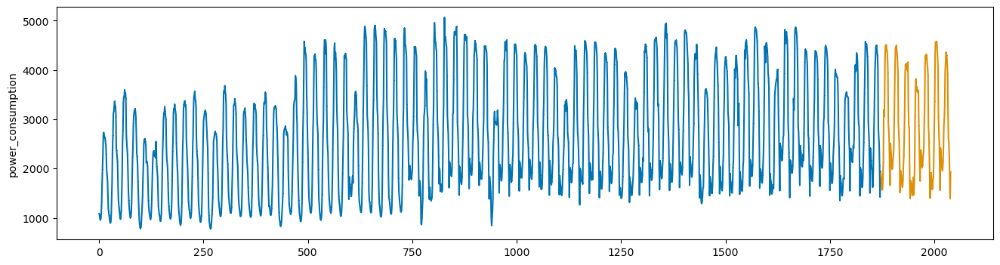

In [304]:
# 1번 건물로 확인
y = train_df2.loc[train_df2['building_num'] == 1, 'power_consumption']
x = train_df2.loc[train_df2['building_num'] == 1, :].drop(columns=['building_num', 'date', 'power_consumption'])

y_train, y_valid, x_train, x_valid = temporal_train_test_split(y = y, X = x, test_size = 168) # 24시간*7일 = 168

print('train data shape\nx:{}, y:{}'.format(x_train.shape, y_train.shape))

plot_series(y_train, y_valid, markers=[',' , ','])
plt.show()

In [305]:
xgb_reg = XGBRegressor(n_estimators = 10000, seed=42,
                       min_child_weight = 1, eta = 0.3,
                       gamma = 0, max_depth = 6, 
                       colsample_bytree = 1, subsample = 1)

xgb_reg.fit(x_train, y_train, eval_set=[(x_train, y_train), (x_valid, y_valid)], early_stopping_rounds=300, verbose=False)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False, eta=0.3,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=None,
             grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=1, missing=nan, monotone_constraints=None,
             n_estimators=10000, n_jobs=None, num_parallel_tree=None,
             predictor=None, ...)

best iterations: 67
SMAPE : 6.782552515144468


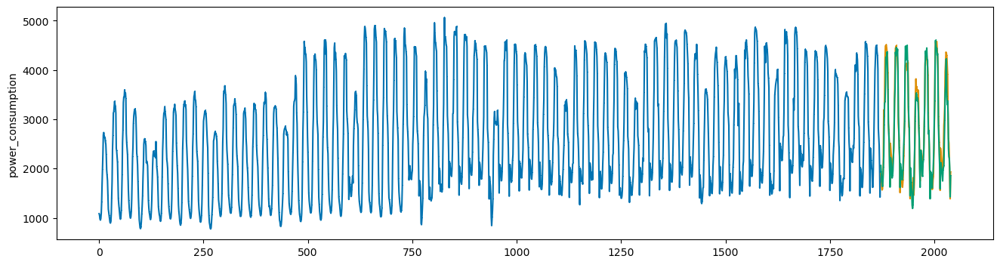

In [306]:
# yellow : true, green : pred
pred = xgb_reg.predict(x_valid)
pred = pd.Series(pred)
pred.index = np.arange(y_valid.index[0], y_valid.index[-1]+1)
plot_series(y_train, y_valid, pd.Series(pred), markers=[',' , ',', ','])

print('best iterations: {}'.format(xgb_reg.best_iteration))
print('SMAPE : {}'.format(SMAPE(y_valid, pred)))

In [307]:
# xgb_reg2 = XGBRegressor(n_estimators = 10000, seed=42,
#                        min_child_weight = 1, eta = 0.3,
#                        gamma = 0, max_depth = 6, 
#                        colsample_bytree = 1, subsample = 1)

# xgb_reg2.set_params(**{'objective':weighted_mse(100)})

# xgb_reg2.fit(x_train, y_train, eval_set=[(x_train, y_train), (x_valid, y_valid)], early_stopping_rounds=300, verbose=False)

In [308]:
# # yellow : true, green : pred
# pred2 = xgb_reg2.predict(x_valid)
# pred2 = pd.Series(pred2)
# pred2.index = np.arange(y_valid.index[0], y_valid.index[-1]+1)
# plot_series(y_train, y_valid, pd.Series(pred2), markers=[',' , ',', ','])

# print('best iterations: {}'.format(xgb_reg2.best_iteration))
# print('SMAPE : {}'.format(SMAPE(y_valid, pred2)))

In [309]:
# plot_series(y_valid, pd.Series(pred), pd.Series(pred2), markers=[',' , ',', ','], labels=['valid', 'pred', 'pred2'])

In [310]:
models = []
scores = []
feature_importances = []
for i in tqdm(range(100)):
    y = train_df2.loc[train_df2.building_num == i+1, 'power_consumption']
    x = train_df2.loc[train_df2.building_num == i+1, ].drop(columns=['building_num', 'date', 'power_consumption'])
    y_train, y_valid, x_train, x_valid = temporal_train_test_split(y = y, X = x, test_size = 168)
    
    model = XGBRegressor(n_estimators = 1000, eta = 0.01, min_child_weight = 1,
                           max_depth = 6, colsample_bytree = 1, 
                           subsample = 1, seed=42)

    model.fit(x_train, y_train, eval_set=[(x_train, y_train), 
                                            (x_valid, y_valid)], early_stopping_rounds=100, verbose=False)

    best_params = model.get_xgb_params()
    y_pred = model.predict(x_valid)
    pred = pd.Series(y_pred)   
    sm = SMAPE(y_valid, y_pred)
    scores.append(sm)

    best_model = XGBRegressor(**best_params, n_estimators = model.best_iteration)
    best_model.fit(x, y)

    feature_importance = best_model.feature_importances_
    feature_importances.append(feature_importance)

    models.append(best_model)

100%|██████████| 100/100 [04:12<00:00,  2.52s/it]


In [311]:
train_df2.columns

Index(['building_num', 'date', 'precipitation', 'humidity',
       'power_consumption', 'sin_weekday', 'cos_weekday', 'sin_hour',
       'cos_hour', 'month_6', 'month_7', 'holiday', 'DI', 'CDH',
       'day_hour_mean', 'day_hour_std', 'hour_mean', 'hour_std', 'wind_chill'],
      dtype='object')

In [312]:
building_num_df = pd.DataFrame({'building_num':range(1,101)})
feature_imp_df = pd.DataFrame(columns=train_df2.drop(columns='power_consumption').columns[2:], data=[value for value in feature_importances])
feature_imp_df = pd.concat([building_num_df, feature_imp_df], axis=1)
feature_imp_df.to_csv('xgb11_feature_imp.csv', index=False)

In [313]:
for column in feature_imp_df.columns:
    print(f'{column} : ', np.sum(feature_imp_df[column].values))

building_num :  5050
precipitation :  0.3372793
humidity :  0.91874254
sin_weekday :  0.67788315
cos_weekday :  0.933904
sin_hour :  0.5121492
cos_hour :  1.0308731
month_6 :  9.558366
month_7 :  1.2514797
holiday :  0.8306906
DI :  3.1531532
CDH :  2.6374652
day_hour_mean :  69.1382
day_hour_std :  1.216631
hour_mean :  3.244347
hour_std :  0.89849603
wind_chill :  3.660339


## Prediction

In [314]:
# Process the missing values of precipitation
test_df['precipitation'].fillna(0, inplace=True) # 강수량은 0으로 채움

In [315]:
# Process the missing values of wind speed and humidity
def fill_missing_with_avg(df, columns):
    for i in range(len(df)):
        if pd.isna(df.loc[i, columns]):
            
            prev_value_sum = df.loc[i-4:i-1, columns].sum()
            next_value_sum = df.loc[i+1:i+4, columns].sum()
            avg_value = (prev_value_sum + next_value_sum) / 8

            df.loc[i, columns] = avg_value

fill_missing_with_avg(test_df, 'windspeed')
fill_missing_with_avg(test_df, 'humidity')

In [316]:
# Convert the type of date from object to datetime
test_df['date'] = pd.to_datetime(test_df['date'], format='%Y%m%d %H')

In [317]:
# Decomposition of time elements
test_df['month'] = test_df.date.dt.month
test_df['day'] = test_df.date.dt.day
test_df['weekday'] = test_df.date.dt.weekday
test_df['hour'] = test_df.date.dt.hour
test_df['date'] = test_df.date.dt.date

In [318]:
# Add time periodic columns
day_periodic = (test_df['day'] - 1) / 30 # 1부터 시작하므로 1을 빼줌
weekday_periodic = test_df['weekday'] / 6
hour_periodic = test_df['hour'] / 23

def sin_transform(values):
    return np.sin(2 * np.pi * values)
def cos_transform(values):
    return np.cos(2 * np.pi * values)

test_df['sin_weekday'] = sin_transform(weekday_periodic)
test_df['cos_weekday'] = cos_transform(weekday_periodic)
test_df['sin_hour'] = sin_transform(hour_periodic)
test_df['cos_hour'] = cos_transform(hour_periodic)

In [319]:
test_df['month_6'] = 0
test_df['month_7'] = 0

In [320]:
# month_dummy = pd.get_dummies(test_df['month']).rename(columns={6:'month_6', 7:'month_7', 8:'month_8'})
# test_df = pd.concat([test_df, month_dummy], axis=1)

In [321]:
# Add holiday column
# holiday = 1, workday = 0
test_df['holiday'] = test_df.apply(lambda x : 0 if x['day']<5 else 1, axis = 1)
test_df.loc[(test_df.date == datetime.date(2022, 6, 6))&(test_df.date == datetime.date(2022, 8, 15)), 'holiday'] = 1

In [322]:
# Add DI column (DI : Discomfort Index (불쾌지수))
test_df['DI'] = 9/5*test_df['temperature'] - 0.55*(1 - test_df['humidity']/100) * (9/5*test_df['humidity'] - 26) + 32

In [323]:
# Add CDH column (CDH : Cooling Degree-Day)
# CDD(냉방도일) -> CDH(냉방도시)로 데이터에 맞게 변형한 개념
# 냉방도일 : 어느 지방의 더운 정도를 나타내는 지표로 사용 (sum(해당 일의 기온 - 기준온도))
# 냉방도일이 크면 연료의 소비량이 많아짐
# 실내온도가 같아도 외부 기온은 지역별로 다름 -> 지역마다 값이 다르게 나타남 -> 이 데이터에서는 건물별로 다르다고 얘기할 수 있음
# 냉방도시 : sum(해당 시간의 기온 - 기준온도)
def CDH(df, num_building):
    df_ = df.copy()
    cdhs = np.array([])
    for num in range(1, num_building+1, 1):
        cdh = []
        cdh_df = df_[df_['building_num'] == num_building]
        cdh_temp = cdh_df['temperature'].values # Series로도 돌릴 수 있지만 array로 돌리는게 속도가 훨씬 빠름
        for i in range(len(cdh_temp)):
            if i < 11:
                cdh.append(np.sum(cdh_temp[:(i+1)] - 26))
            else:
                cdh.append(np.sum(cdh_temp[(i-11):(i+1)] - 26))
        
        cdhs = np.concatenate([cdhs, cdh])
    
    return cdhs

test_df['CDH'] = CDH(test_df, 100)

In [324]:
# 건물별, 요일별, 시간별 발전량 평균 넣어주기
tqdm.pandas()
test_df['day_hour_mean'] = test_df.progress_apply(lambda x : power_mean.loc[(power_mean.building_num == x['building_num']) & (power_mean.hour == x['hour']) & (power_mean.weekday == x['weekday']), 'power_consumption'].values[0], axis = 1)

100%|██████████| 16800/16800 [00:08<00:00, 2025.15it/s]


In [325]:
# 건물별, 요일별, 시간별 발전량 표준편차 넣어주기
tqdm.pandas()
test_df['day_hour_std'] = test_df.progress_apply(lambda x : power_std.loc[(power_std.building_num == x['building_num']) & (power_std.hour == x['hour']) & (power_std.weekday == x['weekday']), 'power_consumption'].values[0], axis = 1)

100%|██████████| 16800/16800 [00:08<00:00, 2041.50it/s]


In [326]:
# 건물별 시간별 발전량 평균 넣어주기
tqdm.pandas()
test_df['hour_mean'] = test_df.progress_apply(lambda x : power_hour_mean.loc[(power_hour_mean.building_num == x['building_num']) & (power_hour_mean.hour == x['hour']) ,'power_consumption'].values[0], axis = 1)

100%|██████████| 16800/16800 [00:04<00:00, 3396.84it/s]


In [327]:
# 건물별 시간별 발전량 표준편차 넣어주기
tqdm.pandas()
test_df['hour_std'] = test_df.progress_apply(lambda x : power_hour_std.loc[(power_hour_std.building_num == x['building_num']) & (power_hour_std.hour == x['hour']) ,'power_consumption'].values[0], axis = 1)

100%|██████████| 16800/16800 [00:04<00:00, 3365.85it/s]


In [328]:
test_df2 = test_df.copy()

In [329]:
# 체감온도 추가
test_df2['wind_chill'] = 13.12 + 0.6215*test_df2['temperature'] - 11.37*(test_df2['windspeed']**(0.16)) + 0.3965*(test_df2['windspeed']**(0.16))*test_df2['temperature']

In [330]:
test_df2.drop(columns=['month', 'day'], inplace=True)

In [331]:
# # Process the missing values of solar, ESS, PCS
# # -을 0으로 대체
# test_df[['solar', 'ess', 'pcs']] = test_df[['solar', 'ess', 'pcs']].replace('-', 0)
# test_df[['solar', 'ess', 'pcs']] = test_df[['solar', 'ess', 'pcs']].astype(float)

In [332]:
# test_df2.drop(columns=['total_area', 'pcs'], inplace=True)

In [333]:
# test_df2['solar'] = (test_df2['solar'] != 0)
# test_df2['ess'] = (test_df2['ess'] != 0)

In [334]:
# bul_type_dummy = pd.get_dummies(test_df2['building_type'])
# test_df2 = pd.concat([test_df2, bul_type_dummy.iloc[:,:-1]], axis=1)

In [335]:
# test_df2.drop(columns=['weekday', 'hour', 'building_type'], inplace=True)

In [336]:
test_df2.drop(columns=['weekday', 'hour', 'windspeed', 'temperature'], inplace=True)

In [337]:
test_df2.columns

Index(['building_num', 'date', 'precipitation', 'humidity', 'sin_weekday',
       'cos_weekday', 'sin_hour', 'cos_hour', 'month_6', 'month_7', 'holiday',
       'DI', 'CDH', 'day_hour_mean', 'day_hour_std', 'hour_mean', 'hour_std',
       'wind_chill'],
      dtype='object')

> ### prediction

In [338]:
preds = []
for i in tqdm(range(100)):
    
    pred = models[i].predict(test_df2[test_df2['building_num'] == i+1].drop(columns=['building_num','date']))
    preds.append(pred)

100%|██████████| 100/100 [00:00<00:00, 212.51it/s]


In [339]:
final = pd.DataFrame({'answer':[]})
for pred in preds:

    pred_df = pd.DataFrame({'answer':pred})
    final = pd.concat([final, pred_df], axis=0)

In [340]:
# 체감온도 넣고 풍속 제거
# sample_submission['answer'] = final.values
# sample_submission.to_csv('xgb11.csv', index=False, float_format='%.10f')

In [346]:
# 체감온도 넣고 기온 풍속 둘 다 제거
sample_submission['answer'] = final.values
sample_submission.to_csv('xgb11_2.csv', index=False, float_format='%.10f')

In [342]:
final

,answer
0,2042.333008
1,1977.520264
2,1764.795288
3,1669.717163
4,1626.132812
...,...
163,893.245728
164,809.771667
165,740.231995
166,615.139771


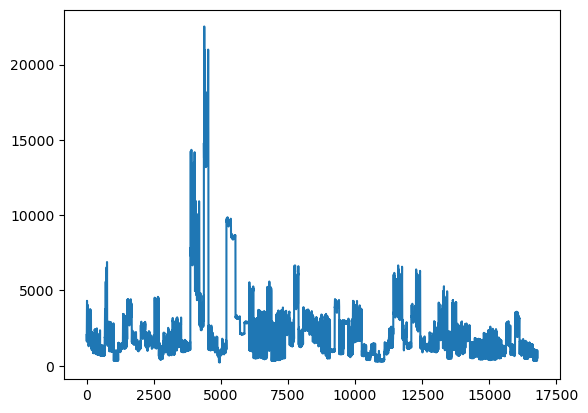

In [343]:
plt.plot(final.values)

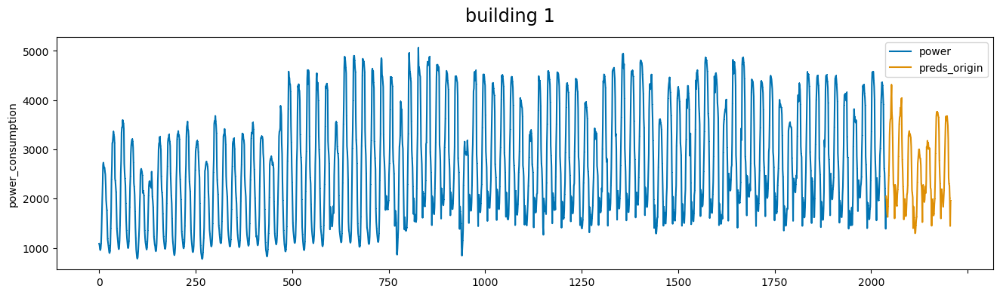

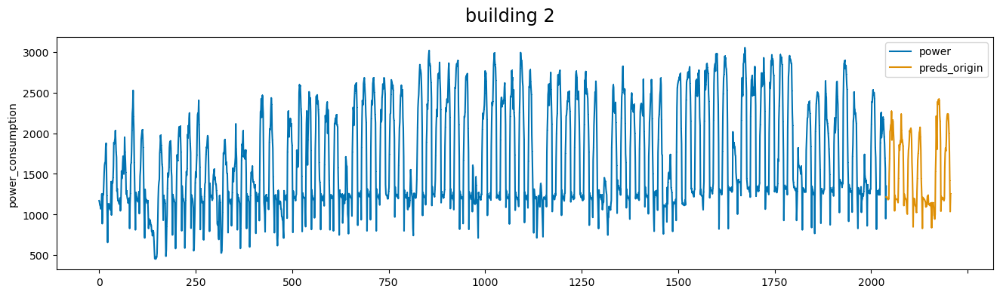

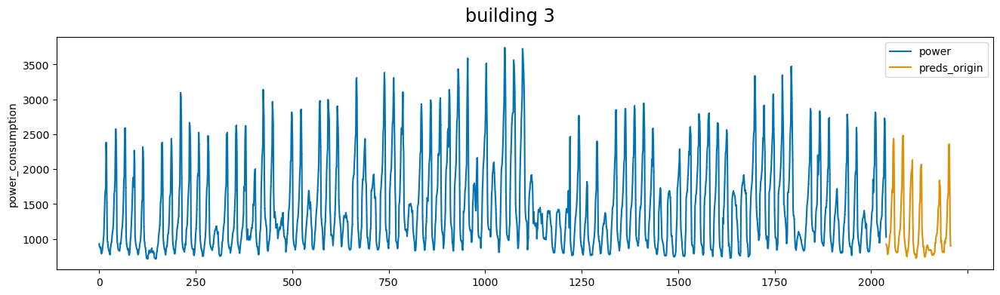

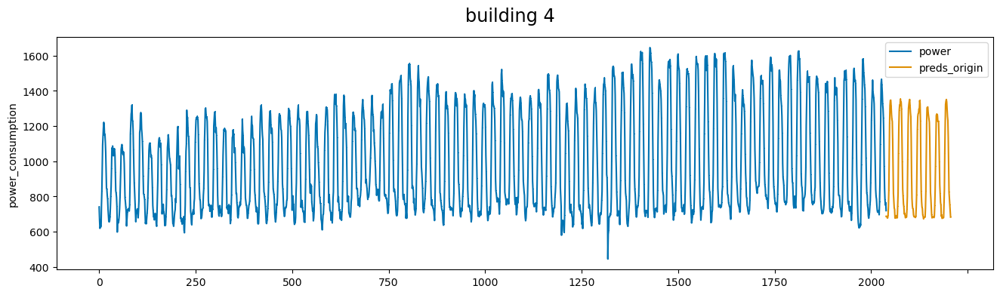

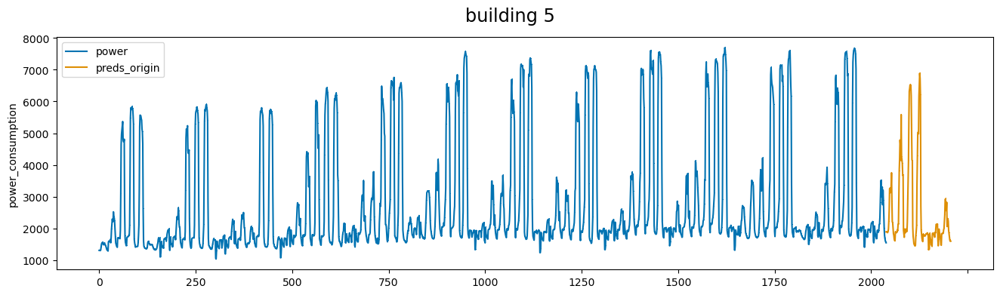

...

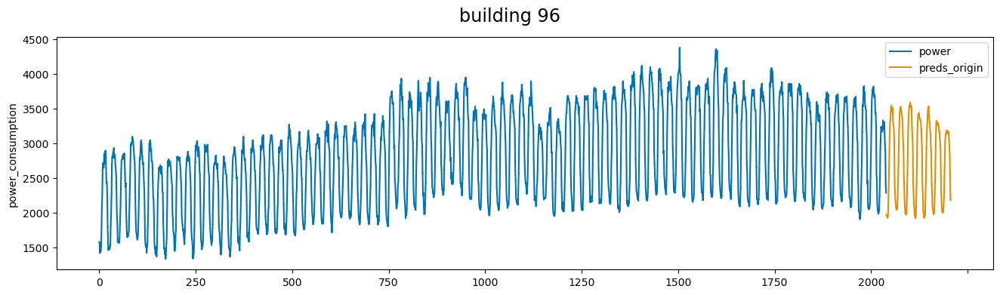

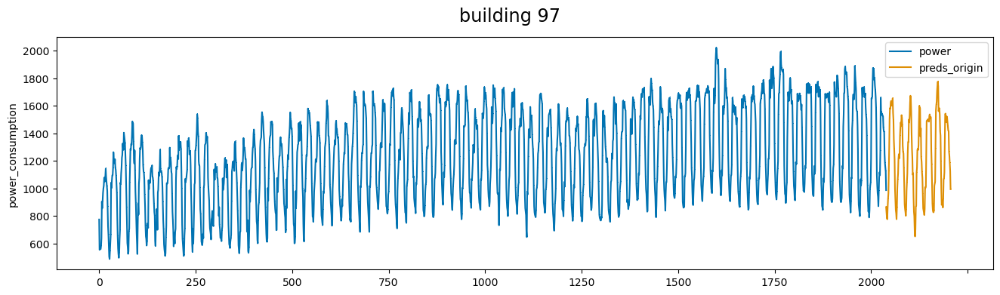

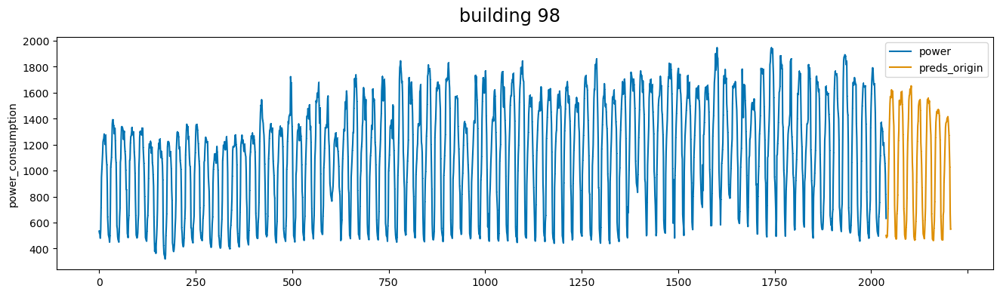

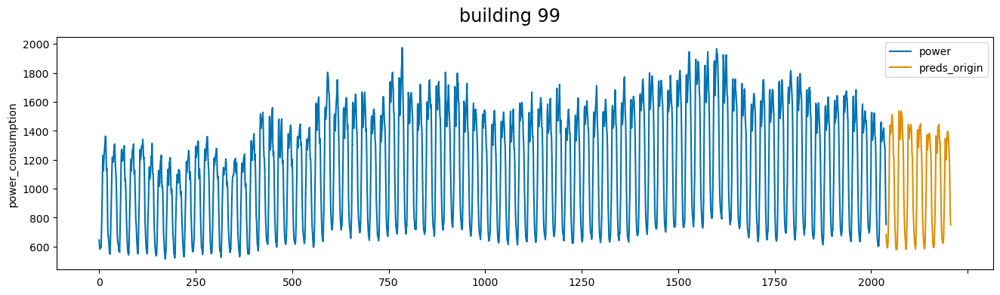

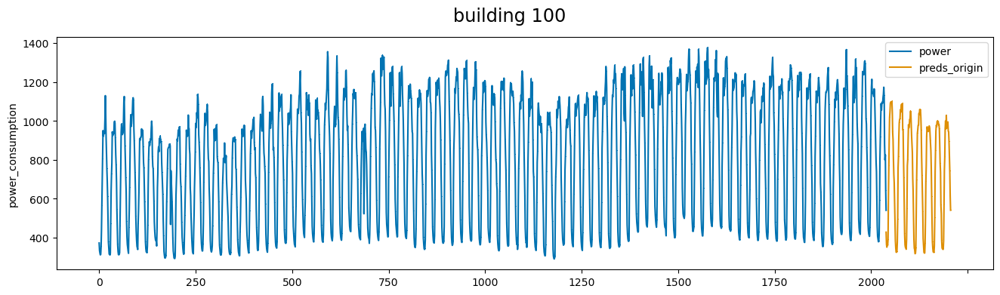

In [344]:
pred_origin = final.answer

for i in range(100):
    power = train_df2.loc[train_df2.building_num == i+1, 'power_consumption'].reset_index(drop=True)
    preds_origin = pred_origin[i*168:(i+1)*168]
    preds_origin.index = range(power.index[-1], power.index[-1]+168)
    
    plot_series(power, preds_origin, markers=[',', ','], labels=['power', 'preds_origin'], title=f'building {i+1}')